#3.社群網路
+ 3.1 取出發文者與推文者的文字
    + 3.2 建立basic_netWork
    + 3.3 建立pers_netWork
    + 3.4 eigenvector centraility(無向圖)
    + 3.5 建立PageRank graph(有向圖)
    + 3.6 建立Hit socre(有向圖)
    + 3.7 建立pers_bet_netWork （betweenness centrality）
    + 3.8 計算最大的subgraph的measure
        +  3.8.1 計算transitivity
        +  3.8.2 計算density
        +  3.8.3 計算distance
        +  3.8.4 計算diameter
        +  3.8.5 計算clustering    

### 3.1 取出發文者與推文者的文字

In [ ]:
! pip install pyvis networkx pandas numpy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.0/756.0 kB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 51.3 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
import pyvis
import networkx as nx
import IPython

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
raw_data = pd.read_csv('drive/MyDrive/Colab Notebooks/project2/raw_data/ptt.csv')
raw_data = raw_data[raw_data.artComment != '[]']
raw_data = raw_data.sample(round(raw_data.shape[0]/200))
print(raw_data.shape)
raw_data.head()


(23, 11)


,system_id,artUrl,artTitle,artDate,artPoster,artCatagory,artContent,artComment,e_ip,insertedDate,dataSource
3576,3577,https://www.ptt.cc/bbs/Gossiping/M.1678764499....,[問卦]高薪高物價怎摸也比低薪高物價好吧,2023-03-14 11:28:17,oz5566,Gossiping,台灣低薪高物價\n日本高薪高物價\n怎摸想日本都比較好啊\n\n查了一下台灣埃鳳還比日本貴\...,"[{""cmtStatus"": ""→"", ""cmtPoster"": ""k798976869"",...",60.248.7.247,2023-03-15 01:34:08,ptt
3756,3757,https://www.ptt.cc/bbs/Gossiping/M.1679028808....,[新聞]電價估漲11%逾8成住宅用電凍漲,2023-03-17 12:53:25,crocus,Gossiping,1.媒體來源:udn\n\n2.記者署名:聯合報／ 記者鍾泓良、林海、胡瑞玲／台北報導\n3...,"[{""cmtStatus"": ""噓"", ""cmtPoster"": ""highyes"", ""c...",118.166.18.252,2023-03-18 01:42:48,ptt
2774,2775,https://www.ptt.cc/bbs/Gossiping/M.1677125973....,[問卦]辦公室像google年輕人比較不在乎薪水？,2023-02-23 12:19:31,Aloee,Gossiping,聽一個老主管語重心長的說\n\n其實只要把辦公室佈置的像google那樣\n\n再擺上幾櫃零...,"[{""cmtStatus"": ""→"", ""cmtPoster"": ""zzz122eee"", ...",42.73.124.66,2023-02-24 01:50:18,ptt
816,817,https://www.ptt.cc/bbs/Gossiping/M.1673841396....,Re:[問卦]為何歐美會種族歧視華人？,2023-01-16 11:56:34,OPPAISuki,Gossiping,因為黃種人 夠奴 吃苦耐勞 薪水又比你歐美人來的低\n\n黑人又比較懶 散漫\n\n自然黃種...,"[{""cmtStatus"": ""推"", ""cmtPoster"": ""paulg"", ""cmt...",118.161.184.160,2023-01-17 01:26:36,ptt
324,325,https://www.ptt.cc/bbs/Gossiping/M.1672928301....,[問卦]有哪間跨國品牌在台灣不盤的？,2023-01-05 22:18:19,xvited945,Gossiping,跨國的食衣住行育樂品牌\n不管是外商直營還是台灣代理\n在台灣的價格似乎都比較高\n\n比如...,"[{""cmtStatus"": ""→"", ""cmtPoster"": ""AustinRivers...",49.216.162.132,2023-01-06 01:35:16,ptt


In [ ]:
#parse comment

def getComtInfo(com):
  cmters,cmt_statuss = [],[]
  com = eval(com)
  for i in com:
    print(i)
    cmters.append(i['cmtPoster'])
    cmt_statuss.append(i['cmtStatus'])
  return pd.Series([cmters, cmt_statuss])

raw_data[['artComter','artStatus']] = raw_data['artComment'].apply(lambda r: getComtInfo(r))

{'cmtStatus': '→', 'cmtPoster': 'k798976869', 'cmtContent': ':日本是已開發國家台灣不是國家怎比', 'cmtDate': '2023-03-14 11:29:00'}
{'cmtStatus': '→', 'cmtPoster': 'deathrow', 'cmtContent': ':世界不是只有日本美國可以跟辛巴威比', 'cmtDate': '2023-03-14 11:32:00'}
{'cmtStatus': '→', 'cmtPoster': 'hoks', 'cmtContent': ':八卦是日本物價不一定比臺灣高，薪水屌打', 'cmtDate': '2023-03-14 12:16:00'}
{'cmtStatus': '噓', 'cmtPoster': 'highyes', 'cmtContent': ':幹你老木的菜母豬ㄘ屎', 'cmtDate': '2023-03-17 12:53:00'}
{'cmtStatus': '噓', 'cmtPoster': 'davidex', 'cmtContent': ':當年抗議油電雙漲的死了沒？沒死別裝死', 'cmtDate': '2023-03-17 12:54:00'}
{'cmtStatus': '推', 'cmtPoster': 'nctugoodman', 'cmtContent': ':漲工業用電很ok阿', 'cmtDate': '2023-03-17 12:54:00'}
{'cmtStatus': '推', 'cmtPoster': 'ru04hj4', 'cmtContent': ':可悲', 'cmtDate': '2023-03-17 12:54:00'}
{'cmtStatus': '噓', 'cmtPoster': 'benxyz', 'cmtContent': ':厲害了有便宜的核電不用偏要漲價', 'cmtDate': '2023-03-17 12:54:00'}
{'cmtStatus': '推', 'cmtPoster': 'andel121', 'cmtContent': ':企業不會將成本轉嫁人民，感謝政府', 'cmtDate': '2023-03-17 12:54:00'}
{'cmtStat

In [ ]:
raw_data = raw_data.explode(['artComter','artStatus'])
socail_data = raw_data[['artUrl','artPoster','artComter','artStatus']]
socail_data.head(10)


,artUrl,artPoster,artComter,artStatus
3576,https://www.ptt.cc/bbs/Gossiping/M.1678764499....,oz5566,k798976869,→
3576,https://www.ptt.cc/bbs/Gossiping/M.1678764499....,oz5566,deathrow,→
3576,https://www.ptt.cc/bbs/Gossiping/M.1678764499....,oz5566,hoks,→
3756,https://www.ptt.cc/bbs/Gossiping/M.1679028808....,crocus,highyes,噓
3756,https://www.ptt.cc/bbs/Gossiping/M.1679028808....,crocus,davidex,噓
3756,https://www.ptt.cc/bbs/Gossiping/M.1679028808....,crocus,nctugoodman,推
3756,https://www.ptt.cc/bbs/Gossiping/M.1679028808....,crocus,ru04hj4,推
3756,https://www.ptt.cc/bbs/Gossiping/M.1679028808....,crocus,benxyz,噓
3756,https://www.ptt.cc/bbs/Gossiping/M.1679028808....,crocus,andel121,推
3756,https://www.ptt.cc/bbs/Gossiping/M.1679028808....,crocus,kent,→


In [ ]:
socail_data.artStatus.unique()

array(['→', '噓', '推'], dtype=object)

### 3.2 建立basic_netWork


In [ ]:
# 建立邊的資料
import random


po_df = socail_data[['artPoster','artUrl']].drop_duplicates().rename(columns = {'artPoster':'src','artUrl':'dis'})
sample_url = random.choices(po_df.dis.unique().tolist(),k=300)
po_df = po_df[po_df.dis.isin(sample_url)]
re_df = socail_data[['artComter','artUrl','artStatus']].rename(columns = {'artComter':'src','artUrl':'dis','artStatus':'weight'})
re_df = re_df[re_df.dis.isin(sample_url)]
re_df = re_df[~re_df['src'].isna()]



def convertStatus(s):
  if s == '推':
    return 2
  elif s == '→':
    return 1
  else :
    return -1
re_df['weight'] = re_df['weight'].map(convertStatus)
re_df = re_df.groupby(['src','dis']).sum().reset_index()

# 設定分數低的為紅色
def getColor(w):
  if w>0:
    return 'green'
  else:
    return 'red'
re_df['color'] = re_df.weight.map(getColor)



In [ ]:
re_df

,src,dis,weight,color
0,A80211ab,https://www.ptt.cc/bbs/Gossiping/M.1672806961....,1,green
1,A98454,https://www.ptt.cc/bbs/Gossiping/M.1675754808....,1,green
2,AMD640,https://www.ptt.cc/bbs/Gossiping/M.1677968682....,1,green
3,ASEVE,https://www.ptt.cc/bbs/Gossiping/M.1679028808....,3,green
4,Adinger,https://www.ptt.cc/bbs/Gossiping/M.1674658914....,1,green
...,...,...,...,...
464,zxcv91039,https://www.ptt.cc/bbs/Gossiping/M.1673070150....,2,green
465,zyxx,https://www.ptt.cc/bbs/Gossiping/M.1677125973....,2,green
466,zyxx,https://www.ptt.cc/bbs/Gossiping/M.1678356930....,2,green
467,zzro,https://www.ptt.cc/bbs/Gossiping/M.1672928301....,1,green


In [ ]:
# 人為綠色節點
# po文為橘色節點

netWork = pyvis.network.Network(notebook=True, cdn_resources='in_line',directed=True)
person = list(set(po_df.src.unique().tolist()+re_df.src.unique().tolist()))
url = po_df.dis.unique().tolist()
netWork.add_nodes(
    nodes = person,
    value = [1 for i in range(len(person))],
    color = ['#66CDAA' for i in range(len(person))],
    title = person
)
netWork.add_nodes(
    nodes = url,
    value = [2 for i in range(len(url))],
    color = ['#FFB366' for i in range(len(url))],
    title = url
)
for i in po_df.to_numpy():
  netWork.add_edge(i[0],i[1],width = 2,color='grey')
for i in re_df.to_numpy():
  netWork.add_edge(i[0],i[1],width = 2,color=i[3])

# 設定layout
netWork.repulsion()

# netWork.toggle_physics(True)
# netWork.set_options("""
# const options = {
#   "physics": {
#     "forceAtlas2Based": {
#       "springLength": 100
#     },
#     "minVelocity": 0.75,
#     "solver": "forceAtlas2Based",
#     "timestep": 0.48
#   }
# }
# """)

netWork.show("./basic_netWork.html")
IPython.display.HTML('basic_netWork.html')

./basic_netWork.html


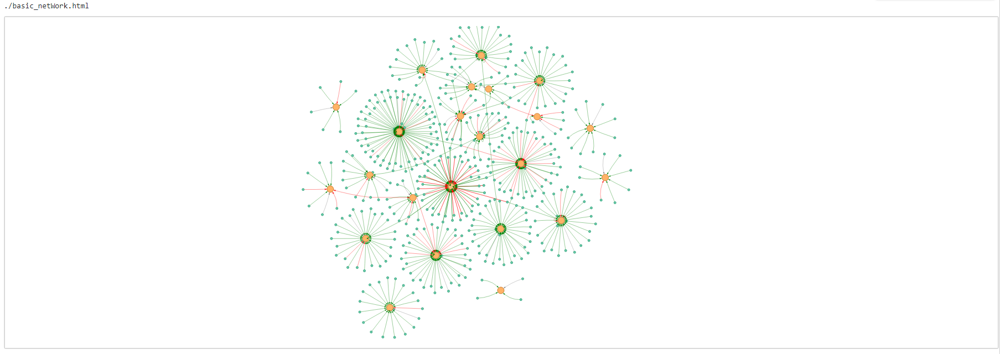

從這張圖可以看出，在所有的文章中，只有一些文章會被熱烈地討論，而文章之間的關聯也沒有非常密切，有些文章是被獨立出來的。
以我們的資料集為例，網路圖最中心的四篇貼文討論度最高。


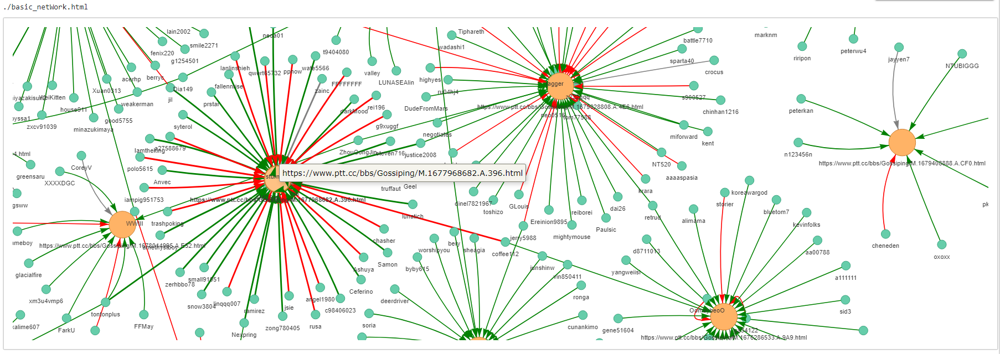

針對討論度最高的貼文重點觀察，發現該篇貼文的內容主要在討論關於民生用電上漲的議題。從回文者的密度來看，可以推測電費上漲這個議題受到更多人的關注，因此回應數量比較多，而且正負面的觀點也較為平均。

### 3.3 建立pers_netWork

In [ ]:
pos_cmt = socail_data.copy()
pos_cmt = pos_cmt[~pos_cmt.artComter.isna()]
pos_cmt.head(10)

,artUrl,artPoster,artComter,artStatus
3576,https://www.ptt.cc/bbs/Gossiping/M.1678764499....,oz5566,k798976869,→
3576,https://www.ptt.cc/bbs/Gossiping/M.1678764499....,oz5566,deathrow,→
3576,https://www.ptt.cc/bbs/Gossiping/M.1678764499....,oz5566,hoks,→
3756,https://www.ptt.cc/bbs/Gossiping/M.1679028808....,crocus,highyes,噓
3756,https://www.ptt.cc/bbs/Gossiping/M.1679028808....,crocus,davidex,噓
3756,https://www.ptt.cc/bbs/Gossiping/M.1679028808....,crocus,nctugoodman,推
3756,https://www.ptt.cc/bbs/Gossiping/M.1679028808....,crocus,ru04hj4,推
3756,https://www.ptt.cc/bbs/Gossiping/M.1679028808....,crocus,benxyz,噓
3756,https://www.ptt.cc/bbs/Gossiping/M.1679028808....,crocus,andel121,推
3756,https://www.ptt.cc/bbs/Gossiping/M.1679028808....,crocus,kent,→


In [ ]:
pos_cmt['score'] = pos_cmt['artStatus'].apply(lambda r: convertStatus(r))
pos_cmt = pos_cmt.groupby(['artComter','artPoster']).sum('score').reset_index()
pos_cmt = pos_cmt[pos_cmt.score>=0]
pos_cmt = pos_cmt[pos_cmt.artComter != pos_cmt.artPoster]
# pos_cmt.score = 1
pos_cmt

,artComter,artPoster,score
0,A80211ab,airua,1
1,A98454,werqq,1
2,AMD640,zainc,1
3,ASEVE,crocus,3
4,Adinger,phantasystar,1
...,...,...,...
464,zxcv91039,brbear,2
465,zyxx,Aloee,2
466,zyxx,aoristcurren,2
467,zzro,xvited945,1


In [ ]:
pers = np.unique(pos_cmt[['artComter', 'artPoster']])
mat = pd.pivot_table(pos_cmt,index = 'artComter', columns = 'artPoster' ,values='score' ).fillna(0)\
  .reindex(columns=pers, index=pers, fill_value=0).to_numpy()
print(mat.shape)
tri = (np.tril(mat,-1).T + np.triu(mat,1))
mat_s = tri+tri.T

# # print((mat == mat.transpose()).all())

# G = nx.DiGraph(mat)
# G_sub = sorted(nx.connected_components(G), key=len, reverse=True)
# G_max_sub = G.subgraph(G_sub[0])
# # 重新定義 mat
# mat = nx.adjacency_matrix(G_max_sub).todense()
# node_idx = list(G_max_sub.nodes)
# # mat = mat[np.ix_(node_idx,node_idx)]
# pers = pers[node_idx]
# print((mat == mat.transpose()).all())

# # 計算無向圖的adj


(406, 406)


In [ ]:
def random_color():
  r = lambda: random.randint(0,255)
  return '#%02X%02X%02X' % (r(),r(),r())

def matPresentGraph(mat:np.array,node_id:list,node_type:list=None,node_value:list = None,directed = True,edge_color=None) -> pyvis.network.Network:

  if directed != True:
    if (mat == mat.transpose()).all():
      print('matrix is Symmetric')
    else:
      print('matrix is not Symmetric')
  if node_type == None:
    c = random_color()
    node_colors = [c for i in range(len(node_id))]
    node_type = [" " for i in range(len(node_id))]
  else:
    node_color_map = {}
    for i in set(node_type):
      while True:
        c = random_color()
        if c not in node_color_map.values():
          break
      node_color_map[i] = c
    node_colors = [node_color_map[i] for i in node_type]
  # print(node_colors)
  if edge_color == None:
    edge_color = random_color()
  edge_color = random_color()
  if node_value == None:
    node_value = [1 for i in range(len(node_id))]

  net = pyvis.network.Network(notebook=True, directed = directed, cdn_resources='in_line')
  
  titles_list = []
  for i ,j in zip(node_id,node_type):
    titles_list.append(str(i)+":"+str(j))

  net.add_nodes(
      nodes = node_id,
      value = node_value,
      label = node_id,
      title = titles_list,
      color = node_colors
  )

  for row in range(len(node_id)):
    for col in range(len(node_id)):
      if mat[row][col]>0.:
        net.add_edge(
            node_id[row],node_id[col],width = mat[row][col],color = edge_color,title = mat[row][col]
        )
  net.repulsion()
  return net


In [ ]:
# 定義發文者（po）、評論者(cmt)、兩者兼具(both)
node_type = []

cmt_list = pos_cmt['artComter'].unique().tolist()
po_list = pos_cmt['artPoster'].unique().tolist()
both_list = list(set(cmt_list) & set(po_list))
for p in pers:
  if p in both_list:
    node_type.append('both')

  elif p in cmt_list:
    node_type.append('cmt')

  elif p in po_list:
    node_type.append('po')



In [ ]:
net = matPresentGraph(mat = mat,node_id = pers,node_type = node_type)
net.show("./pers_netWork.html")
IPython.display.HTML('pers_netWork.html')

./pers_netWork.html


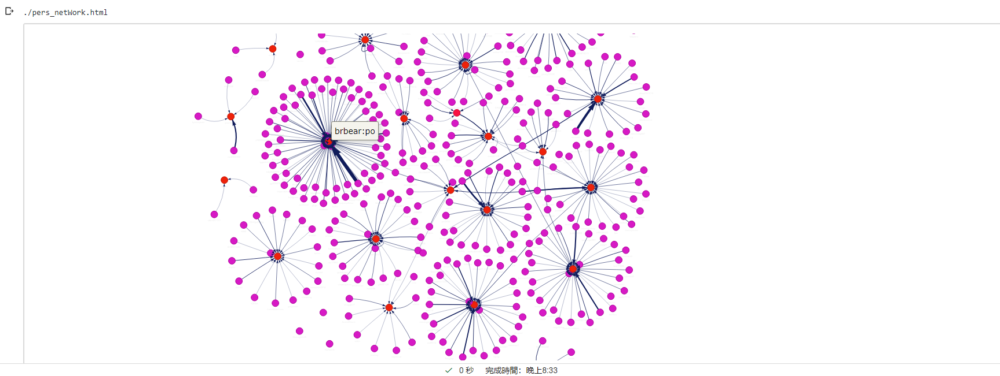

從這張網路圖中我們可以看出在整個討論版資料集中，每一個發文者、回應者，以及兩者兼具的使用者之間的關係為何。<br ><br >
以上圖為例，帳號 "brbear" 的這名發文者的文章受到許多人的回覆，畫面中較粗的箭頭代表該名回應者的回應其貼文的頻率較高，可將此應用在找出社群網路中哪些人之間的關係較為密切。<br ><br >
此外，我們也可以看出不同貼文的回應者之間是否有所關聯，進而找到特定族群可能會感興趣的話題。


### 3.4 eigenvector centraility(無向圖)



In [ ]:

eigenvec = np.array(list(nx.eigenvector_centrality(nx.Graph(mat_s),max_iter = 10000).values()))
eigenvec = (eigenvec-np.min(eigenvec))/(np.max(eigenvec)-np.min(eigenvec))


In [ ]:
q = np.quantile(eigenvec,[.2,.4,.6,.8])
q

array([3.00258463e-12, 1.61329493e-06, 3.93820779e-05, 3.47619501e-04])

In [ ]:
node_value = []


for i in eigenvec:

  if i > q[3]:
    node_value.append(25)
  elif i >q[2]:
    node_value.append(20)
  elif i>q[1]:
    node_value.append(15)
  elif i>q[0]:
    node_value.append(10)
  else:
    node_value.append(5)
net = matPresentGraph(mat = mat,node_id = pers,node_type = node_type,node_value = node_value,directed=False)
net.show("./pers_eig_netWork.html")
IPython.display.HTML('pers_eig_netWork.html')


matrix is not Symmetric
./pers_eig_netWork.html


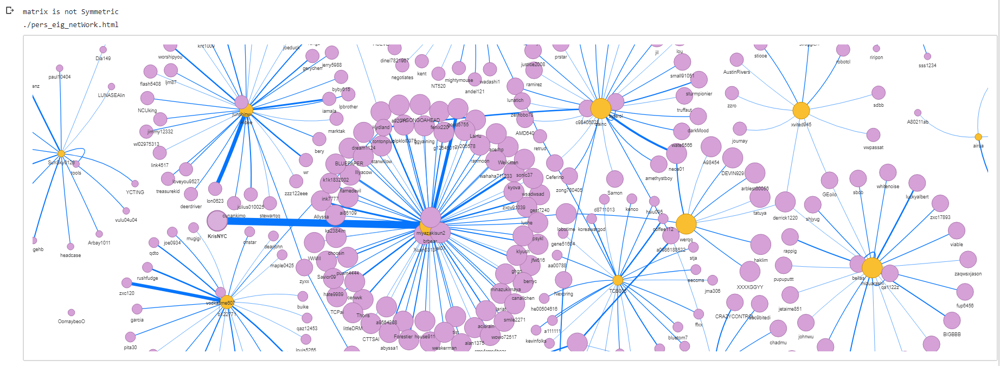

我們可以發現有多次評論的人，或是評論的文章同時有多人評論的，其重要程度愈高。

### 3.5 建立PageRank graph(有向圖)

In [ ]:
# Digraph 設定有向圖
pagerank = np.array(list(nx.pagerank(nx.DiGraph(mat)).values()))
# pagerank = (pagerank-np.min(pagerank))/(np.max(pagerank)-np.min(pagerank))
pagerank

array([0.0013745 , 0.0013745 , 0.0013745 , 0.0013745 , 0.0013745 ,
       0.0013745 , 0.0013745 , 0.03933275, 0.0013745 , 0.0013745 ,
       0.0013745 , 0.0013745 , 0.0013745 , 0.0013745 , 0.0013745 ,
       0.0013745 , 0.009133  , 0.0013745 , 0.0013745 , 0.0013745 ,
       0.0013745 , 0.0013745 , 0.0013745 , 0.0013745 , 0.0013745 ,
       0.0013745 , 0.0013745 , 0.0013745 , 0.0013745 , 0.0013745 ,
       0.0013745 , 0.0013745 , 0.0013745 , 0.0013745 , 0.0013745 ,
       0.0013745 , 0.0013745 , 0.0013745 , 0.0013745 , 0.0013745 ,
       0.0013745 , 0.0013745 , 0.0013745 , 0.0013745 , 0.0013745 ,
       0.0013745 , 0.0013745 , 0.0013745 , 0.00604629, 0.0013745 ,
       0.0013745 , 0.0013745 , 0.0013745 , 0.0013745 , 0.0013745 ,
       0.0013745 , 0.0013745 , 0.0013745 , 0.01714177, 0.0013745 ,
       0.02765329, 0.0013745 , 0.0013745 , 0.0013745 , 0.0013745 ,
       0.0013745 , 0.0013745 , 0.0013745 , 0.0013745 , 0.0013745 ,
       0.0013745 , 0.0013745 , 0.0013745 , 0.0013745 , 0.00137

In [ ]:
net = matPresentGraph(mat = mat,node_id = pers,node_type = node_type,node_value=(pagerank*1000).tolist())
net.show("./pers_page_netWork.html")
IPython.display.HTML('pers_page_netWork.html')


./pers_page_netWork.html


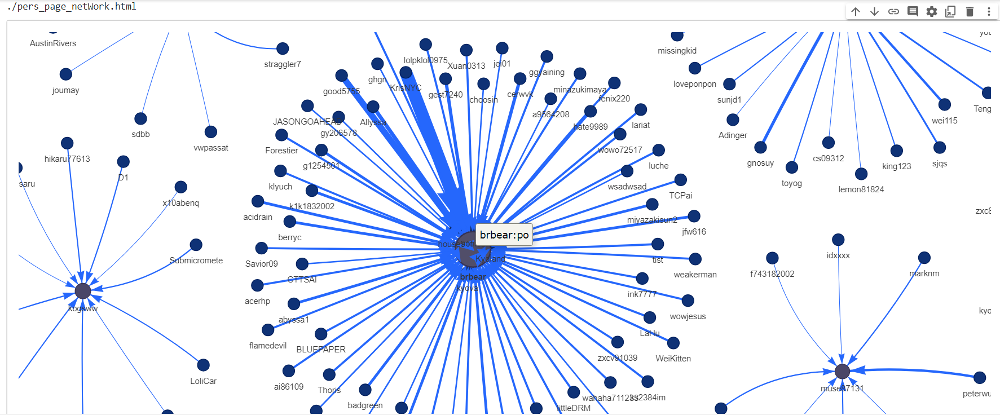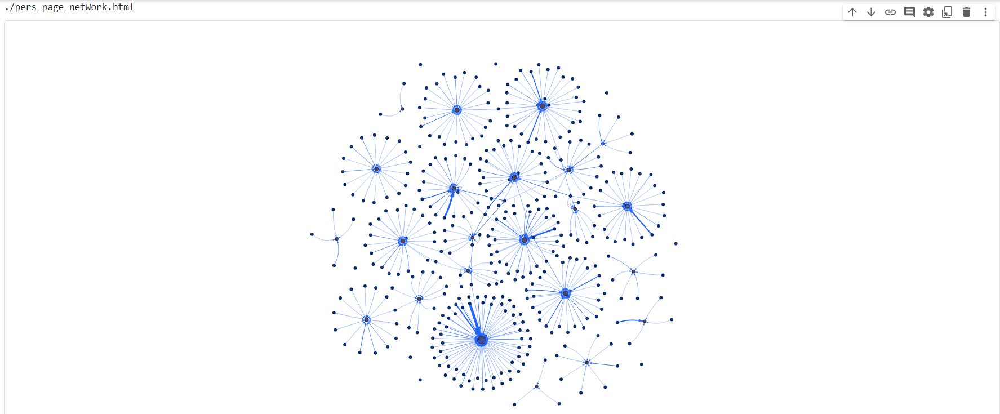

可以看出indegree 較多，重要程度愈高

### 3.6 建立Hit socre(有向圖)

In [ ]:
out_,in_ = nx.hits(nx.DiGraph(mat),max_iter=100)
out_,in_ = np.array(list(out_.values())),np.array(list(in_.values()))
out_ = (out_-np.min(out_))/(np.max(out_)-np.min(out_))
in_ = (in_-np.min(in_))/(np.max(in_)-np.min(in_))


In [ ]:
in_q = np.quantile(in_,[.2,.4,.6,.8])
out_q = np.quantile(out_,[.2,.4,.6,.8])


In [ ]:
in_q

array([2.67605839e-16, 2.69857873e-16, 2.70828314e-16, 2.73377403e-16])

In [ ]:
node_value = []


for i in out_:
  if i > out_q[3]:
    node_value.append(25)
  elif i >out_q[2]:
    node_value.append(20)
  elif i>out_q[1]:
    node_value.append(15)
  elif i>out_q[0]:
    node_value.append(10)
  else:
    node_value.append(5)

net = matPresentGraph(mat = mat,node_id = pers,node_type = node_type,node_value=node_value)
net.show("./pers_out_netWork.html")
IPython.display.HTML('pers_out_netWork.html')

./pers_out_netWork.html


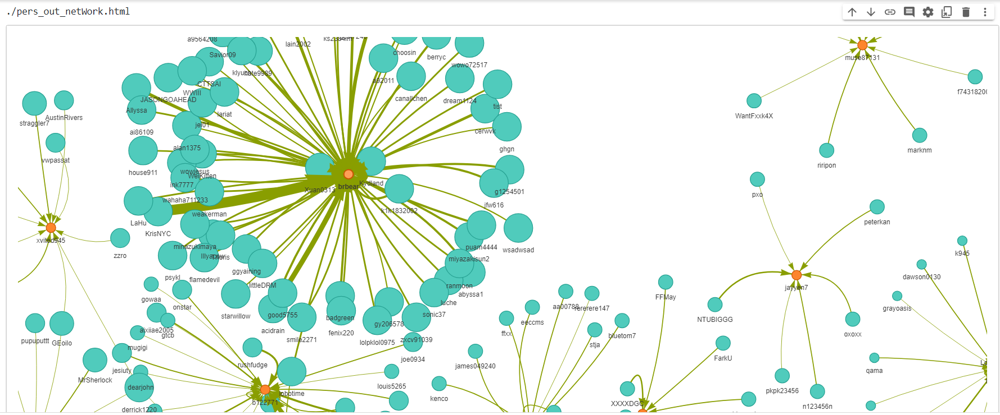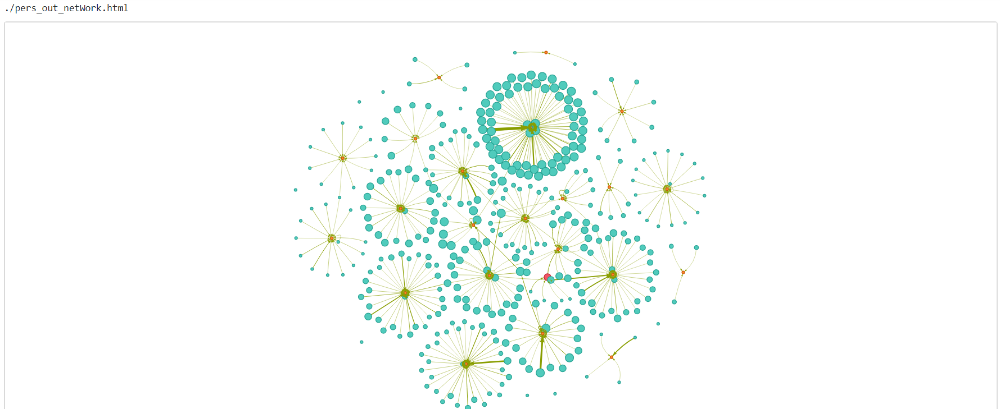

In [ ]:
node_value = []
for i in in_:
  if i > in_q[3]:
    node_value.append(25)
  elif i >in_q[2]:
    node_value.append(20)
  elif i>in_q[1]:
    node_value.append(15)
  elif i>in_q[0]:
    node_value.append(10)
  else:
    node_value.append(5)

net = matPresentGraph(mat = mat,node_id = pers,node_type = node_type,node_value=node_value)
net.show("./pers_in_netWork.html")
IPython.display.HTML('pers_in_netWork.html')

./pers_in_netWork.html


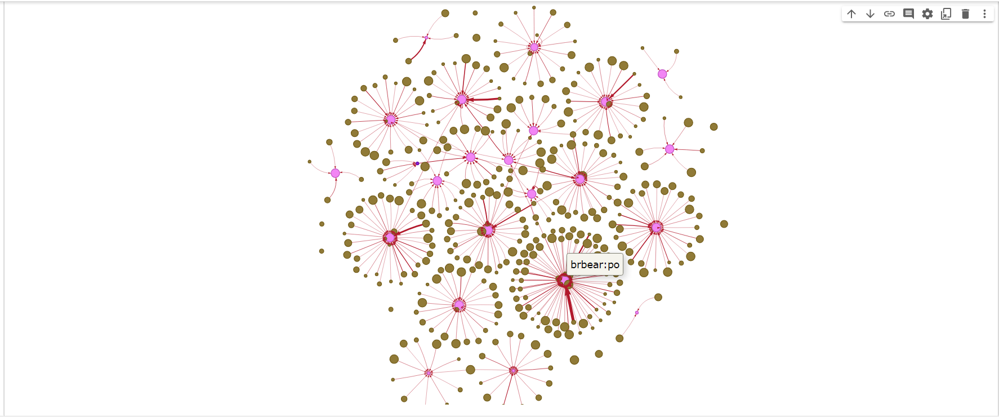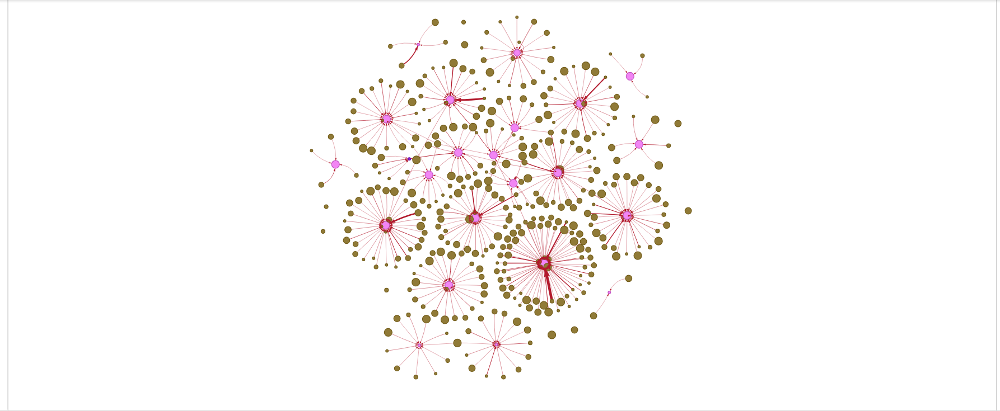

不論是indegree或是outdegree，其degree的值越高表示連結到越多的節點，該點在網路圖當中的重要性也越高。<br ><br >

以上圖為例，brbear的這篇po文degree值最高，因此該名創作者很可能較為重要。

### 3.7 建立pers_bet_netWork （betweenness centrality）

In [ ]:
bet = np.array(list(nx.betweenness_centrality(nx.Graph(mat_s)).values()))
bet = (bet-np.min(bet))/(np.max(bet)-np.min(bet))
bet_q = np.quantile(bet,[.2,.4,.6,.8])

In [ ]:
node_value = []
for i in bet:
  if i > bet_q[3]:
    node_value.append(25)
  elif i > bet_q[2]:
    node_value.append(20)
  elif i>bet_q[1]:
    node_value.append(15)
  elif i>bet_q[0]:
    node_value.append(10)
  else:
    node_value.append(5)

net = matPresentGraph(mat = mat,node_id = pers,node_type = node_type,node_value=node_value)
net.show("./pers_bet_netWork.html")
IPython.display.HTML('pers_bet_netWork.html')

./pers_bet_netWork.html


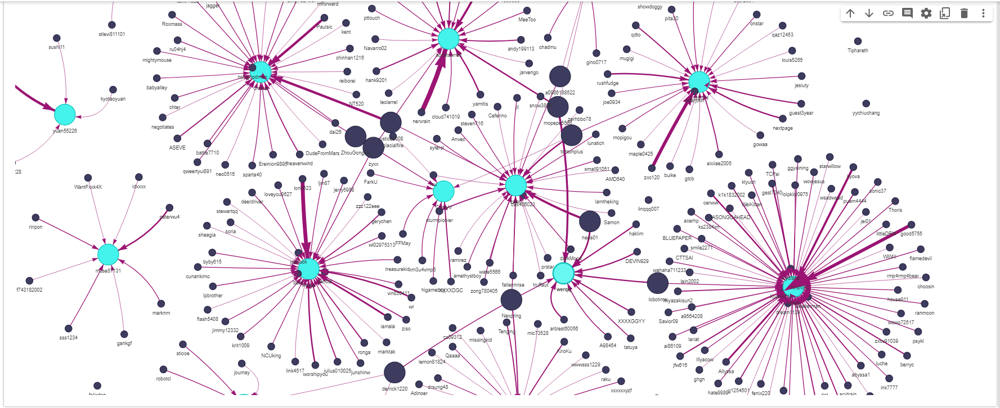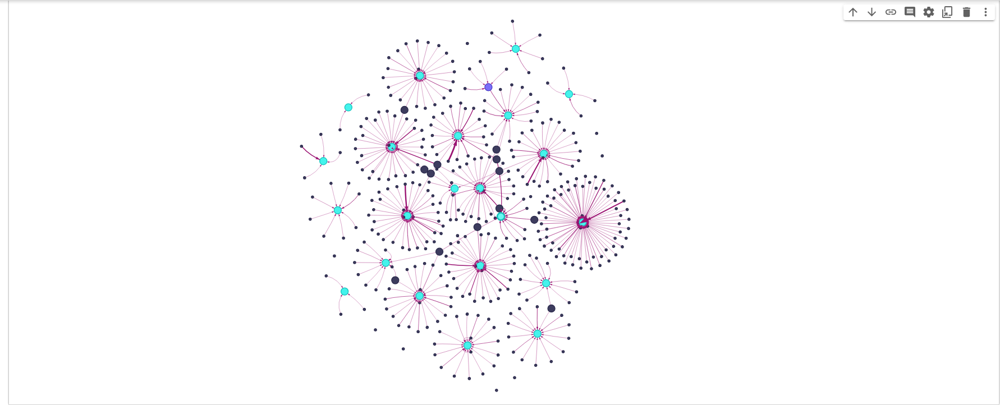

從用戶之間的 betweeness 網路圖，我們可以看出整個那些節點是隱性的關鍵。這些點在其他的圖中可能會被視為不太重要的小節點，但在計算 betweeness 的值過後，我們可以輕易地將它們標示出來。<br ><br >
如前面幾張圖的結果，我們知道發文者"brbear"是一個重要的角色，他所發布的某篇文章也有著很高的討論度。透過這剛 betweeness 的網路圖，我們還可以經由重要連接點找出與他相關聯的文章以及創作者有哪些。

Transitivity/Density/Distance/Diameter/Clustering

計算最大的subgraph 的 measure

In [ ]:
# 計算max subgraph
G = nx.Graph(mat_s)
G_sub = sorted(nx.connected_components(G), key=len, reverse=True)
G_max_sub = G.subgraph(G_sub[0])
# # 重新定義 mat
sub_mat = nx.adjacency_matrix(G_max_sub).todense()
node_idx = list(G_max_sub.nodes)
sub_pers = pers[node_idx]


### 3.8 計算最大的subgraph的measure

In [ ]:
net = matPresentGraph(mat=sub_mat,node_id=sub_pers,directed=False)
net.show("./max_sub.html")
IPython.display.HTML('max_sub.html')

matrix is Symmetric
./max_sub.html


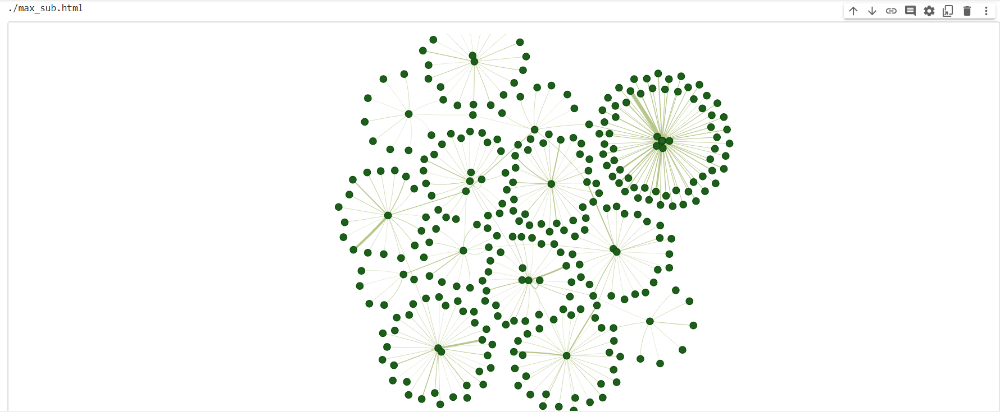

最大的subgraph涵蓋前幾張圖都有提到的 brbear 所發布的貼文<br >[[新聞] 4月電價調整 民生月用500度以上喊漲](https://)

#### 3.8.1 計算transitivity

In [ ]:
nx.transitivity(nx.Graph(sub_mat))

0

#### 3.8.2 計算density

In [ ]:
nx.density(nx.Graph(sub_mat))

0.006308777429467085

#### 3.8.3 計算distance

In [ ]:
nx.average_shortest_path_length(nx.Graph(sub_mat))

6.42740987460815

#### 3.8.4 計算diameter

In [ ]:
nx.diameter(nx.Graph(sub_mat))

12

####3.8.5 計算clustering

In [ ]:
nx.average_clustering(nx.Graph(sub_mat))

0.0